<a href="https://colab.research.google.com/github/MYVirajani/AI-Music-Generation/blob/main/AI_music_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [6]:
!pip install music21 -q

In [7]:
from google.colab import drive
drive.mount('/content/drive')

import zipfile

zip_path = '/content/drive/MyDrive/music_generation/music.zip'
extract_path = '/content/midi_dataset'

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

import glob
midi_files = glob.glob(f'{extract_path}/**/*.mid', recursive=True) + glob.glob(f'{extract_path}/**/*.midi', recursive=True)
print(f"Found {len(midi_files)} MIDI files")
print(midi_files[:5])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Found 292 MIDI files
['/content/midi_dataset/music/chopin/chpn-p19.mid', '/content/midi_dataset/music/chopin/chpn-p17.mid', '/content/midi_dataset/music/chopin/chpn-p18.mid', '/content/midi_dataset/music/chopin/chpn-p4.mid', '/content/midi_dataset/music/chopin/chpn_op25_e11.mid']


**Preprocess MIDI files into note sequences**

In [8]:
from music21 import converter, instrument, note, chord
import pickle
import os

def extract_notes_from_file(midi_path):
    """Extract notes/chords from a single MIDI file."""
    notes = []
    try:
        midi = converter.parse(midi_path)
        parts = instrument.partitionByInstrument(midi)
        elements = parts.parts[0].recurse() if parts else midi.flat.notes

        for el in elements:
            if isinstance(el, note.Note):
                notes.append(str(el.pitch))
            elif isinstance(el, chord.Chord):
                notes.append('.'.join(str(n) for n in el.normalOrder))
    except Exception as e:
        print(f"Skipping {midi_path}: {e}")
    return notes


all_notes = []
for i, file in enumerate(midi_files):
    print(f"Processing {i+1}/{len(midi_files)}: {os.path.basename(file)}")
    all_notes.extend(extract_notes_from_file(file))

print(f"\nTotal notes/chords extracted: {len(all_notes)}")
print(f"Sample: {all_notes[:20]}")


save_dir = '/content/drive/MyDrive/music_generation'
os.makedirs(save_dir, exist_ok=True)

with open(f'{save_dir}/notes.pkl', 'wb') as f:
    pickle.dump(all_notes, f)

print("Saved notes.pkl to Drive")

Processing 1/292: chpn-p19.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 2002 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 2/292: chpn-p17.mid
Processing 3/292: chpn-p18.mid
Processing 4/292: chpn-p4.mid
Processing 5/292: chpn_op25_e11.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Et\xfcde Opus 25, No. 11'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Sturmet\xfcde'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 1999 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 6/292: chpn-p13.mid
Processing 7/292: chpn-p12.mid
Processing 8/292: chpn-p23.mid
Processing 9/292: chpn_op27_1.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 2003 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 10/292: chpn-p8.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 1997 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 11/292: chpn-p9.mid
Processing 12/292: chpn-p7.mid
Processing 13/292: chpn-p15.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 1997 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 14/292: chpn_op35_1.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2002 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 15/292: chpn_op66.mid
Processing 16/292: chpn_op53.mid
Processing 17/292: chpn_op7_1.mid
Processing 18/292: chpn_op25_e4.mid
Processing 19/292: chpn-p2.mid
Processing 20/292: chpn_op35_3.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 2002 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 21/292: chpn_op27_2.mid
Processing 22/292: chpn_op23.mid
Processing 23/292: chpn_op25_e2.mid
Processing 24/292: chpn_op10_e12.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Et\xfcde Nr. 12'>; getting generic Instrument
  warnings.warn(


Processing 25/292: chpn_op35_2.mid
Processing 26/292: chpn-p5.mid
Processing 27/292: chpn-p11.mid
Processing 28/292: chpn_op33_2.mid
Processing 29/292: chpn_op10_e05.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Et\xfcde Opus 10 No. 5'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Schwarze-Tasten-Et\xfcde'>; getting generic Instrument
  warnings.warn(


Processing 30/292: chpn-p21.mid
Processing 31/292: chpn-p20.mid
Processing 32/292: chpn-p14.mid
Processing 33/292: chpn_op25_e1.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2002 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 34/292: chpn-p16.mid
Processing 35/292: chpn_op7_2.mid
Processing 36/292: chpn_op33_4.mid
Processing 37/292: chpn-p3.mid
Processing 38/292: chpn-p1.mid
Processing 39/292: chpn-p10.mid
Processing 40/292: chpn_op25_e12.mid
Processing 41/292: chpn_op10_e01.mid
Processing 42/292: chp_op18.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 1997 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 43/292: chpn-p22.mid
Processing 44/292: chpn_op35_4.mid
Processing 45/292: chpn-p24.mid
Processing 46/292: chpn_op25_e3.mid
Processing 47/292: chp_op31.mid
Processing 48/292: chpn-p6.mid
Processing 49/292: scn16_3.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2007 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 50/292: scn16_1.mid
Processing 51/292: scn15_12.mid
Processing 52/292: scn15_9.mid
Processing 53/292: scn15_3.mid
Processing 54/292: scn15_1.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Von fremden L\xe4ndern und Menschen'>; getting generic Instrument
  warnings.warn(


Processing 55/292: scn15_8.mid
Processing 56/292: scn15_11.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'F\xfcrchtenmachen'>; getting generic Instrument
  warnings.warn(


Processing 57/292: scn16_5.mid
Processing 58/292: schum_abegg.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 2004 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 59/292: scn16_7.mid
Processing 60/292: scn15_10.mid
Processing 61/292: scn15_4.mid
Processing 62/292: scn15_2.mid
Processing 63/292: scn16_2.mid
Processing 64/292: scn16_6.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2006 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 65/292: scn68_10.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Schumann:   Fr\xf6hlicher Landmann, von der Arbeit zur\xfcckkehrend'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'aus Album f\xfcr die Jugend Opus 68, Nr. 10'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Schumann: Fr\xf6hlicher Landmann'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENC

Processing 66/292: scn15_7.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Tr\xe4umerei'>; getting generic Instrument
  warnings.warn(


Processing 67/292: scn15_13.mid
Processing 68/292: scn15_6.mid
Processing 69/292: scn68_12.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Schumann: Knecht Ruprecht aus  Album f\xfcr die Jugend Opus 68'>; getting generic Instrument
  warnings.warn(


Processing 70/292: scn16_4.mid
Processing 71/292: scn16_8.mid
Processing 72/292: scn15_5.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Gl\xfcckes genug'>; getting generic Instrument
  warnings.warn(


Processing 73/292: muss_4.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2000 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 74/292: muss_1.mid
Processing 75/292: muss_6.mid
Processing 76/292: muss_5.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Promenade - Ballett der K\xfcchlein  in ihren Eierschalen'>; getting generic Instrument
  warnings.warn(


Processing 77/292: muss_7.mid
Processing 78/292: muss_2.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=6, data=b'Copyright \xa9 2000 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 79/292: muss_8.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Baba-Yaga  - Das gro\xdfe Tor von Kiew'>; getting generic Instrument
  warnings.warn(


Processing 80/292: muss_3.mid
Processing 81/292: islamei.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 2000 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 82/292: beethoven_hammerklavier_4.mid
Processing 83/292: mond_3.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Mondscheinsonate; der Gr\xe4fin Giulietta Guiccardi gewidmet'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 1998 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 84/292: beethoven_opus22_2.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2009 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 85/292: mond_2.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 1998 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 86/292: pathetique_2.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=6, data=b'Beethoven Sonata No. 8 C minor, Grand Sonate path\xe9tique 2. Movement'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=7, data=b'Copyright \xa9 2003 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 87/292: beethoven_opus90_2.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2010 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 88/292: beethoven_opus10_3.mid
Processing 89/292: beethoven_les_adieux_2.mid
Processing 90/292: beethoven_opus90_1.mid
Processing 91/292: appass_1.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2001 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 92/292: mond_1.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=6, data=b'Copyright \xa9 1998 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 93/292: waldstein_1.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2003 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 94/292: elise.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'F\xfcr Elise'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=3, data=b'Beethoven F\xfcr Elise'>; getting generic Instrument
  warnings.warn(


Processing 95/292: beethoven_opus10_1.mid
Processing 96/292: pathetique_1.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Beethoven Sonata No. 8 C minor, Grand Sonate path\xe9tique 1. Movement'>; getting generic Instrument
  warnings.warn(


Processing 97/292: beethoven_les_adieux_3.mid
Processing 98/292: beethoven_les_adieux_1.mid
Processing 99/292: beethoven_hammerklavier_2.mid
Processing 100/292: beethoven_hammerklavier_1.mid
Processing 101/292: waldstein_2.mid
Processing 102/292: beethoven_opus22_1.mid
Processing 103/292: beethoven_hammerklavier_3.mid
Processing 104/292: appass_3.mid
Processing 105/292: beethoven_opus22_3.mid
Processing 106/292: pathetique_3.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Beethoven Sonata No. 8 C minor, Grand Sonate path\xe9tique 3. Movement'>; getting generic Instrument
  warnings.warn(


Processing 107/292: appass_2.mid
Processing 108/292: beethoven_opus22_4.mid
Processing 109/292: waldstein_3.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=6, data=b'Copyright \xa9 2003 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 110/292: beethoven_opus10_2.mid
Processing 111/292: liz_rhap12.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2004 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 112/292: liz_liebestraum.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2005 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 113/292: liz_et_trans8.mid
Processing 114/292: liz_et4.mid
Processing 115/292: liz_et6.mid
Processing 116/292: liz_rhap09.mid
Processing 117/292: liz_et5.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 1998 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 118/292: liz_rhap02.mid
Processing 119/292: liz_et_trans4.mid
Processing 120/292: liz_et_trans5.mid
Processing 121/292: liz_donjuan.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=6, data=b'Copyright \xa9 2004 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 122/292: liz_et1.mid
Processing 123/292: liz_rhap15.mid
Processing 124/292: liz_rhap10.mid
Processing 125/292: liz_et2.mid
Processing 126/292: liz_et3.mid
Processing 127/292: grieg_berceuse.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2012 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 128/292: grieg_zwerge.mid
Processing 129/292: grieg_spring.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Grieg: Lyrische St\xfccke Op. 43 Nr. 6 Book III - An den Fr\xfchling'>; getting generic Instrument
  warnings.warn(


Processing 130/292: grieg_kobold.mid
Processing 131/292: grieg_wanderer.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Grieg: Lyrische St\xfccke Op. 43 Nr. 2 - Einsamer Wanderer'>; getting generic Instrument
  warnings.warn(


Processing 132/292: grieg_walzer.mid
Processing 133/292: grieg_wedding.mid
Processing 134/292: grieg_waechter.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'W\xe4chterlied Op12, No. 3'>; getting generic Instrument
  warnings.warn(


Processing 135/292: grieg_march.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Grieg: Lyrische St\xfccke, Norwegischer Bauernmarsch, Opus 54 Nr. 2'>; getting generic Instrument
  warnings.warn(


Processing 136/292: grieg_brooklet.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Grieg: Lyrische St\xfccke, B\xe4chlein, Opus 62 Nr. 4'>; getting generic Instrument
  warnings.warn(


Processing 137/292: grieg_album.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Grieg: Lyrische St\xfccke, Albumblatt, Opus 42 Nr. 2'>; getting generic Instrument
  warnings.warn(


Processing 138/292: grieg_halling.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Grieg: Lyrische St\xfccke Book II Opus 38 Nr. 4 - Halling'>; getting generic Instrument
  warnings.warn(


Processing 139/292: grieg_elfentanz.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Grieg: Lyrische St\xfccke Op. 12 Nr. 4 Elfentanz'>; getting generic Instrument
  warnings.warn(


Processing 140/292: grieg_once_upon_a_time.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Grieg: Lyrische St\xfccke, Es war einmal, Opus 71 Nr. 1'>; getting generic Instrument
  warnings.warn(


Processing 141/292: grieg_butterfly.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Grieg: Lyrische St\xfccke Op. 43 No. 1 - Schmetterling'>; getting generic Instrument
  warnings.warn(


Processing 142/292: grieg_voeglein.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'V\xf6glein Op 43, No. 4'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=3, data=b'Grieg: V\xf6glein, Op. 43 No. 4'>; getting generic Instrument
  warnings.warn(


Processing 143/292: gra_esp_3.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 2001 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 144/292: gra_esp_2.mid
Processing 145/292: gra_esp_4.mid
Processing 146/292: haydn_35_3.mid
Processing 147/292: haydn_43_1.mid
Processing 148/292: haydn_43_3.mid
Processing 149/292: hay_40_2.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 1998 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 150/292: haydn_33_3.mid
Processing 151/292: haydn_43_2.mid
Processing 152/292: haydn_7_3.mid
Processing 153/292: haydn_35_1.mid
Processing 154/292: haydn_7_1.mid
Processing 155/292: haydn_8_2.mid
Processing 156/292: haydn_8_4.mid
Processing 157/292: haydn_9_1.mid
Processing 158/292: haydn_35_2.mid
Processing 159/292: hay_40_1.mid
Processing 160/292: haydn_8_3.mid
Processing 161/292: haydn_9_3.mid
Processing 162/292: haydn_33_1.mid
Processing 163/292: haydn_33_2.mid
Processing 164/292: haydn_9_2.mid
Processing 165/292: haydn_7_2.mid
Processing 166/292: haydn_8_1.mid
Processing 167/292: mz_570_3.mid
Processing 168/292: mz_333_2.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 1997 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 169/292: mz_330_2.mid
Processing 170/292: mz_330_1.mid
Processing 171/292: mz_570_2.mid
Processing 172/292: mz_332_2.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2006 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 173/292: mz_545_1.mid
Processing 174/292: mz_311_3.mid
Processing 175/292: mz_570_1.mid
Processing 176/292: mz_311_2.mid
Processing 177/292: mz_331_2.mid
Processing 178/292: mz_332_3.mid
Processing 179/292: mz_311_1.mid
Processing 180/292: mz_330_3.mid
Processing 181/292: mz_545_2.mid
Processing 182/292: mz_332_1.mid
Processing 183/292: mz_545_3.mid
Processing 184/292: mz_333_1.mid
Processing 185/292: mz_331_3.mid
Processing 186/292: mz_331_1.mid
Processing 187/292: mz_333_3.mid
Processing 188/292: debussy_cc_6.mid
Processing 189/292: debussy_cc_4.mid
Processing 190/292: deb_menu.mid
Processing 191/292: deb_prel.mid
Processing 192/292: debussy_cc_1.mid
Processing 193/292: debussy_cc_2.mid
Processing 194/292: debussy_cc_3.mid
Processing 195/292: burg_geschwindigkeit.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=5, data=b'Copyright \xa9 2012 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 196/292: burg_agitato.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 2012 by Bernd Kr\xfcger'>; getting generic Instrument
  warnings.warn(


Processing 197/292: burg_erwachen.mid
Processing 198/292: burg_gewitter.mid
Processing 199/292: burg_sylphen.mid
Processing 200/292: burg_perlen.mid
Processing 201/292: burg_quelle.mid
Processing 202/292: burg_trennung.mid
Processing 203/292: burg_spinnerlied.mid
Processing 204/292: brahms_opus117_1.mid
Processing 205/292: brahms_opus117_2.mid
Processing 206/292: brahms_opus1_3.mid
Processing 207/292: brahms_opus1_4.mid
Processing 208/292: br_im2.mid
Processing 209/292: br_im5.mid
Processing 210/292: brahms_opus1_1.mid
Processing 211/292: brahms_opus1_2.mid
Processing 212/292: br_rhap.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Produced 1997 by Bernd Kr\xfcger.'>; getting generic Instrument
  warnings.warn(


Processing 213/292: bach_846.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=8, data=b'Copyright 2004 by Bernd Kr\xfcger.'>; getting generic Instrument
  warnings.warn(


Processing 214/292: bach_847.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=7, data=b'Copyright 2004 by Bernd Kr\xfcger.'>; getting generic Instrument
  warnings.warn(


Processing 215/292: bach_850.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'Pr\xe4ludium und Fuge in D-Dur, BWV 850'>; getting generic Instrument
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=8, data=b'Copyright 1997 by Bernd Kr\xfcger.'>; getting generic Instrument
  warnings.warn(


Processing 216/292: ty_mai.mid
Processing 217/292: ty_november.mid
Processing 218/292: ty_oktober.mid
Processing 219/292: ty_maerz.mid
Processing 220/292: ty_juli.mid
Processing 221/292: ty_januar.mid
Processing 222/292: ty_september.mid
Processing 223/292: ty_februar.mid
Processing 224/292: ty_august.mid
Processing 225/292: ty_april.mid
Processing 226/292: ty_dezember.mid
Processing 227/292: ty_juni.mid
Processing 228/292: alb_se2.mid
Processing 229/292: alb_se8.mid
Processing 230/292: alb_se5.mid
Processing 231/292: alb_se3.mid
Processing 232/292: alb_esp5.mid
Processing 233/292: alb_esp4.mid
Processing 234/292: alb_se4.mid
Processing 235/292: alb_se1.mid
Processing 236/292: alb_se7.mid
Processing 237/292: alb_esp1.mid
Processing 238/292: alb_esp3.mid
Processing 239/292: alb_esp6.mid
Processing 240/292: alb_se6.mid
Processing 241/292: alb_esp2.mid
Processing 242/292: schumm-2.mid
Processing 243/292: schub_d960_1.mid
Processing 244/292: schuim-1.mid
Processing 245/292: schuim-4.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 1996 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 246/292: schuim-3.mid
Processing 247/292: schubert_D850_4.mid
Processing 248/292: schu_143_3.mid
Processing 249/292: schub_d760_2.mid
Processing 250/292: schub_d760_4.mid
Processing 251/292: schuim-2.mid
Processing 252/292: schumm-3.mid
Processing 253/292: schubert_D850_3.mid
Processing 254/292: schubert_D935_2.mid
Processing 255/292: schubert_D850_1.mid
Processing 256/292: schubert_D935_3.mid
Processing 257/292: schubert_D935_1.mid
Processing 258/292: schubert_D935_4.mid
Processing 259/292: schumm-1.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=4, data=b'Copyright \xa9 1999 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 260/292: schub_d760_3.mid
Processing 261/292: schub_d960_2.mid
Processing 262/292: schumm-6.mid
Processing 263/292: schub_d960_3.mid
Processing 264/292: schu_143_2.mid
Processing 265/292: schu_143_1.mid
Processing 266/292: schumm-4.mid
Processing 267/292: schubert_D850_2.mid
Processing 268/292: schub_d760_1.mid
Processing 269/292: schumm-5.mid
Processing 270/292: schub_d960_4.mid
Processing 271/292: bor_ps7.mid
Processing 272/292: bor_ps6.mid
Processing 273/292: bor_ps2.mid
Processing 274/292: bor_ps3.mid
Processing 275/292: bor_ps5.mid
Processing 276/292: bor_ps1.mid
Processing 277/292: bor_ps4.mid
Processing 278/292: mendel_op62_3.mid
Processing 279/292: mendel_op19_6.mid
Processing 280/292: mendel_op30_1.mid
Processing 281/292: mendel_op30_5.mid
Processing 282/292: mendel_op30_3.mid
Processing 283/292: mendel_op30_2.mid
Processing 284/292: mendel_op62_4.mid
Processing 285/292: mendel_op19_5.mid
Processing 286/292: mendel_op19_4.mid
Processing 287/292: mendel_op53_5.mid
Pr

/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=0, data=b'J\xe4gerlied'>; getting generic Instrument
  warnings.warn(


Processing 289/292: mendel_op30_4.mid
Processing 290/292: mendel_op62_5.mid
Processing 291/292: mendel_op19_1.mid


/usr/local/lib/python3.13/dist-packages/music21/midi/translate.py:922: TranslateWarning: Unable to determine instrument from <music21.midi.MidiEvent SEQUENCE_TRACK_NAME, track=6, data=b'Copyright \xa9 2010 by Bernd Krueger'>; getting generic Instrument
  warnings.warn(


Processing 292/292: mendel_op19_2.mid

Total notes/chords extracted: 11362
Sample: ['B-4', 'F4', 'F#4', 'E-5', 'C#5', 'C#5', 'F#4', 'G#4', 'B-4', 'B-4', 'B-4', 'C#5', 'A4', 'B-4', 'F#5', 'F5', 'F5', 'B-4', 'C5', 'E-5']
Saved notes.pkl to Drive


**Build vocabulary and training sequences**

In [9]:
import numpy as np
from tensorflow.keras.utils import to_categorical

sequence_length = 100


pitch_names = sorted(set(all_notes))
n_vocab = len(pitch_names)
note_to_int = {n: i for i, n in enumerate(pitch_names)}
int_to_note = {i: n for i, n in enumerate(pitch_names)}

print(f"Vocabulary size: {n_vocab}")


network_input = []
network_output = []

for i in range(len(all_notes) - sequence_length):
    seq_in = all_notes[i:i + sequence_length]
    seq_out = all_notes[i + sequence_length]
    network_input.append([note_to_int[n] for n in seq_in])
    network_output.append(note_to_int[seq_out])

n_patterns = len(network_input)
print(f"Total training patterns: {n_patterns}")


X = np.reshape(network_input, (n_patterns, sequence_length, 1))
X = X / float(n_vocab)


y = to_categorical(network_output, num_classes=n_vocab)

print(f"X shape: {X.shape}, y shape: {y.shape}")


with open(f'{save_dir}/mappings.pkl', 'wb') as f:
    pickle.dump({
        'note_to_int': note_to_int,
        'int_to_note': int_to_note,
        'n_vocab': n_vocab,
        'sequence_length': sequence_length
    }, f)

print("Saved mappings.pkl to Drive")

Vocabulary size: 222
Total training patterns: 11262
X shape: (11262, 100, 1), y shape: (11262, 222)
Saved mappings.pkl to Drive


**Build the LSTM model**

In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization, Activation

def build_model(input_shape, n_vocab):
    model = Sequential([
        LSTM(256, input_shape=input_shape, return_sequences=True),
        Dropout(0.3),
        LSTM(256, return_sequences=True),
        Dropout(0.3),
        LSTM(256),
        BatchNormalization(),
        Dropout(0.3),
        Dense(256),
        Activation('relu'),
        Dense(n_vocab),
        Activation('softmax')
    ])
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

model = build_model((X.shape[1], X.shape[2]), n_vocab)
model.summary()

/usr/local/lib/python3.13/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 100, 256)       │       264,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100, 256)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 100, 256)       │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 100, 256)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 256)            │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 222)            │        57,054 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 222)            │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,438,686 (5.49 MB)

 Trainable params: 1,438,174 (5.49 MB)

 Non-trainable params: 512 (2.00 KB)

**Set up checkpoints and train**

In [11]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import os

checkpoint_dir = f'{save_dir}/checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)

checkpoint_path = os.path.join(checkpoint_dir, 'model-{epoch:02d}-{loss:.4f}.keras')

callbacks = [
    ModelCheckpoint(
        checkpoint_path,
        monitor='loss',
        save_best_only=True,
        mode='min',
        verbose=1
    ),
    EarlyStopping(
        monitor='loss',
        patience=15,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='loss',
        factor=0.5,
        patience=5,
        min_lr=0.00001,
        verbose=1
    )
]

history = model.fit(
    X, y,
    epochs=100,
    batch_size=64,
    callbacks=callbacks
)


model.save(f'{save_dir}/final_model.keras')
print(f"Model saved to {save_dir}/final_model.keras")

Epoch 1/100
175/176 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.0334 - loss: 4.8023
Epoch 1: loss improved from None to 4.62670, saving model to /content/drive/MyDrive/music_generation/checkpoints/model-01-4.6267.keras

Epoch 1: finished saving model to /content/drive/MyDrive/music_generation/checkpoints/model-01-4.6267.keras
176/176 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.0386 - loss: 4.6267 - learning_rate: 0.0010
Epoch 2/100
175/176 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0464 - loss: 4.4512
Epoch 2: loss improved from 4.62670 to 4.45492, saving model to /content/drive/MyDrive/music_generation/checkpoints/model-02-4.4549.keras

Epoch 2: finished saving model to /content/drive/MyDrive/music_generation/checkpoints/model-02-4.4549.keras
176/176 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.0465 - loss: 4.4549 - learning_rate: 0.0010
Epoch 3/100
175/176 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.0535 - loss: 4.3852
Epoch 3: loss improved from 4.45492 to 4.377

**Plot the training loss**

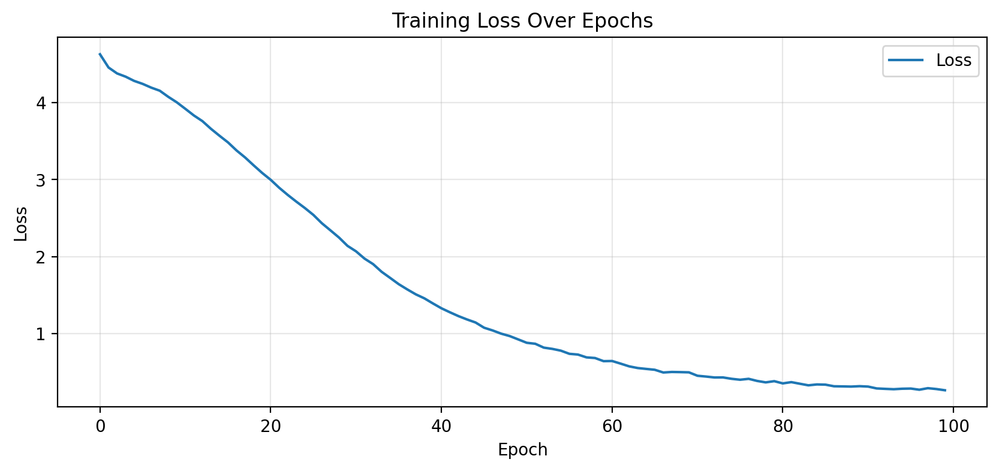

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 4))
plt.plot(history.history['loss'], label='Loss')
plt.title('Training Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

**Temperature sampling + generation function**

In [14]:
def sample_with_temperature(predictions, temperature=1.0):
    """Sample an index from a probability array, adjusted by temperature.
    Lower temperature (0.2-0.5) = safer, more repetitive/predictable.
    Higher temperature (1.0-1.5) = more random/creative, riskier.
    """
    predictions = np.asarray(predictions).astype('float64')
    predictions = np.log(predictions + 1e-8) / temperature
    exp_preds = np.exp(predictions)
    predictions = exp_preds / np.sum(exp_preds)
    probas = np.random.multinomial(1, predictions, 1)
    return np.argmax(probas)


def generate_notes(model, network_input, int_to_note, n_vocab,
                    num_notes=200, temperature=1.0, seed_index=None):
    """Generate a new sequence of notes/chords using the trained model."""
    if seed_index is None:
        seed_index = np.random.randint(0, len(network_input) - 1)

    pattern = list(network_input[seed_index])
    prediction_output = []

    for note_index in range(num_notes):
        input_seq = np.reshape(pattern, (1, len(pattern), 1))
        input_seq = input_seq / float(n_vocab)

        prediction = model.predict(input_seq, verbose=0)[0]
        index = sample_with_temperature(prediction, temperature)

        result = int_to_note[index]
        prediction_output.append(result)

        pattern.append(index)
        pattern = pattern[1:]

    return prediction_output

**Run generation**

In [15]:
# Generate at a moderate temperature first
generated_sequence = generate_notes(
    model=model,
    network_input=network_input,
    int_to_note=int_to_note,
    n_vocab=n_vocab,
    num_notes=200,
    temperature=0.8
)

print(f"Generated {len(generated_sequence)} notes/chords")
print(generated_sequence[:30])

Generated 200 notes/chords
['F3', '3.6', 'A2', 'F3', '11.3', 'E3', '7', 'A2', '9', '4', '9', '9', '3.6', '4', '11.3', '5', '5', '4', '4', '7', '9', '4', '4', '4', '7', '7', '9', '11', '4', '11']


In [16]:
generated_sequence = generate_notes(
    model=model,
    network_input=network_input,
    int_to_note=int_to_note,
    n_vocab=n_vocab,
    num_notes=200,
    temperature=0.5
)

print(f"Generated {len(generated_sequence)} notes/chords")
print(generated_sequence[:30])

Generated 200 notes/chords
['G#4', 'G#4', '7.10', '7.10', 'E5', 'E5', 'E5', 'E5', '5.8.0', 'A4', 'A4', 'A4', 'A4', '0.4.7', 'E5', 'E5', 'E5', 'E5', 'C#3', '7.10', 'B4', 'B4', 'B4', 'B4', 'C3', '7.10', 'F5', 'F5', 'F5', '2.4.8']


In [17]:
generated_sequence = generate_notes(
    model=model,
    network_input=network_input,
    int_to_note=int_to_note,
    n_vocab=n_vocab,
    num_notes=200,
    temperature=1.2
)

print(f"Generated {len(generated_sequence)} notes/chords")
print(generated_sequence[:30])

Generated 200 notes/chords
['7.10.2', '7', '9', '2', '10', '9', '2.5.9', '2', '2', '9', '9', '9.0.4', '0', '2', '2', '4', '4', '2.5.9', '4', '4', '0', '9.0.4', '9', '0', '4', '8.11', '4', '4.8', '0', '0']


**Convert generated sequence to MIDI**

In [18]:
from music21 import stream
import os

def create_midi(prediction_output, output_path='generated_output.mid', note_duration=0.5):
    offset = 0
    output_notes = []

    for pattern in prediction_output:
        # Chord (contains a '.' separating multiple pitch numbers)
        if ('.' in pattern) or pattern.isdigit():
            chord_notes_str = pattern.split('.')
            notes_in_chord = []
            for current_note in chord_notes_str:
                new_note = note.Note(int(current_note))
                new_note.storedInstrument = instrument.Piano()
                notes_in_chord.append(new_note)
            new_chord = chord.Chord(notes_in_chord)
            new_chord.offset = offset
            output_notes.append(new_chord)
        # Single note
        else:
            new_note = note.Note(pattern)
            new_note.offset = offset
            new_note.storedInstrument = instrument.Piano()
            output_notes.append(new_note)

        offset += note_duration

    midi_stream = stream.Stream(output_notes)
    midi_stream.write('midi', fp=output_path)
    print(f"MIDI saved to {output_path}")
    return output_path

output_dir = f'{save_dir}/generated_outputs'
os.makedirs(output_dir, exist_ok=True)

midi_path = create_midi(
    generated_sequence,
    output_path=f'{output_dir}/generated_temp08.mid'
)

MIDI saved to /content/drive/MyDrive/music_generation/generated_outputs/generated_temp08.mid


**Listen to it directly**

In [19]:
# Install FluidSynth for MIDI → audio conversion
!apt-get install -y fluidsynth 2>/dev/null
!pip install midi2audio -q


import os
if not os.path.exists('/content/soundfont.sf2'):
    !wget -q https://github.com/FluidSynth/fluidsynth/raw/master/sf2/VintageDreamsWaves-v2.sf2 -O /content/soundfont.sf2

from midi2audio import FluidSynth
from IPython.display import Audio

fs = FluidSynth('/content/soundfont.sf2')
wav_path = midi_path.replace('.mid', '.wav')
fs.midi_to_audio(midi_path, wav_path)

Audio(wav_path)

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  at-spi2-core fluid-soundfont-gm gsettings-desktop-schemas libatk-bridge2.0-0
  libatk1.0-0 libatk1.0-data libatspi2.0-0 libdouble-conversion3 libevdev2
  libfluidsynth3 libgtk-3-0 libgtk-3-bin libgtk-3-common libgudev-1.0-0
  libinput-bin libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a
  libqt5dbus5 libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5
  librsvg2-common libwacom-bin libwacom-common libwacom9 libxcb-icccm4
  libxcb-image0 libxcb-keysyms1 libxcb-render-util0 libxcb-util1
  libxcb-xinerama0 libxcb-xinput0 libxcb-xkb1 libxcomposite1
  libxkbcommon-x11-0 libxtst6 qsynth qt5-gtk-platformtheme
  qttranslations5-l10n session-migration timgm6mb-soundfont
Suggested packages:
  fluid-soundfont-gs gvfs qt5-image-formats-plugins qtwayland5 jackd
The following NEW packages will be installed:
  at-spi2-core fluid-soundfont

**Generate and compare multiple temperatures at once**

In [20]:
temperatures = [0.5, 0.8, 1.2]
results = {}

for temp in temperatures:
    print(f"\nGenerating at temperature={temp}...")
    seq = generate_notes(model, network_input, int_to_note, n_vocab,
                          num_notes=200, temperature=temp)
    path = create_midi(seq, output_path=f'{output_dir}/generated_temp{str(temp).replace(".", "")}.mid')
    wav = path.replace('.mid', '.wav')
    fs.midi_to_audio(path, wav)
    results[temp] = wav

print("\nAll versions generated. Play each below:")


Generating at temperature=0.5...
MIDI saved to /content/drive/MyDrive/music_generation/generated_outputs/generated_temp05.mid

Generating at temperature=0.8...
MIDI saved to /content/drive/MyDrive/music_generation/generated_outputs/generated_temp08.mid

Generating at temperature=1.2...
MIDI saved to /content/drive/MyDrive/music_generation/generated_outputs/generated_temp12.mid

All versions generated. Play each below:
